# Лабораторная работа №5


# Ансамбли моделей машинного обучения. Часть 1.

In [1]:
import numpy as np
import pandas as pd
from typing import Dict, Tuple
from scipy import stats
from IPython.display import Image
from io import StringIO 
from IPython.display import Image
import graphviz 
import pydotplus
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import ExtraTreesClassifier, ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score 
from sklearn.metrics import roc_curve, roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

## Загрузка и первичный анализ данных


In [2]:
data = pd.read_csv('BIKE DETAILS.csv', sep=",")

In [3]:
data.shape

(1061, 7)

In [4]:
# типы колонок
data.dtypes

name                  object
selling_price          int64
year                   int64
seller_type           object
owner                 object
km_driven              int64
ex_showroom_price    float64
dtype: object

In [5]:
data.replace('NA', np.nan, inplace=True)

In [6]:
data.head(5)

,name,selling_price,year,seller_type,owner,km_driven,ex_showroom_price
0,Royal Enfield Classic 350,175000,2019,Individual,1st owner,350,NaN
1,Honda Dio,45000,2017,Individual,1st owner,5650,NaN
2,Royal Enfield Classic Gunmetal Grey,150000,2018,Individual,1st owner,12000,148114.0
3,Yamaha Fazer FI V 2.0 [2016-2018],65000,2015,Individual,1st owner,23000,89643.0
4,Yamaha SZ [2013-2014],20000,2011,Individual,2nd owner,21000,NaN


In [7]:
# кол-во пропущенные значений (тк нулевые значения в данном датасете - конкретное значения)
nan_count = (data.isna().sum())
print(nan_count)

name                   0
selling_price          0
year                   0
seller_type            0
owner                  0
km_driven              0
ex_showroom_price    435
dtype: int64


Обработка пропусков в числовых данных

In [8]:
from sklearn.impute import SimpleImputer
from sklearn.impute import MissingIndicator

imp = SimpleImputer(strategy='median')

data['ex_showroom_price'] = imp.fit_transform(data[['ex_showroom_price']])

In [9]:
nan_count = (data.isna().sum())
print(nan_count)

name                 0
selling_price        0
year                 0
seller_type          0
owner                0
km_driven            0
ex_showroom_price    0
dtype: int64


In [10]:
data.head(5)

,name,selling_price,year,seller_type,owner,km_driven,ex_showroom_price
0,Royal Enfield Classic 350,175000,2019,Individual,1st owner,350,72752.5
1,Honda Dio,45000,2017,Individual,1st owner,5650,72752.5
2,Royal Enfield Classic Gunmetal Grey,150000,2018,Individual,1st owner,12000,148114.0
3,Yamaha Fazer FI V 2.0 [2016-2018],65000,2015,Individual,1st owner,23000,89643.0
4,Yamaha SZ [2013-2014],20000,2011,Individual,2nd owner,21000,72752.5


### Сделаем кодирование категориальных признаков с помощью LabelEncoder

In [11]:
from sklearn.preprocessing import LabelEncoder

In [12]:
label_encoder = LabelEncoder()

data= data.drop('name', axis=1)

data['seller_type'] = label_encoder.fit_transform(data['seller_type'])
data['owner'] = label_encoder.fit_transform(data['owner'])


In [13]:
data.head()

,selling_price,year,seller_type,owner,km_driven,ex_showroom_price
0,175000,2019,1,0,350,72752.5
1,45000,2017,1,0,5650,72752.5
2,150000,2018,1,0,12000,148114.0
3,65000,2015,1,0,23000,89643.0
4,20000,2011,1,1,21000,72752.5


## С использованием метода train_test_split разделим выборку на обучающую и тестовую.

In [14]:
X = data.drop('selling_price', axis=1)
y = data['selling_price']

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X.values[:, [3,4]], y, test_size=0.3, random_state=1)

In [16]:
X_train

array([[42000. , 72752.5],
       [42000. , 81000. ],
       [16000. , 72752.5],
       ...,
       [45354. , 72752.5],
       [30000. , 72752.5],
       [51000. , 86744. ]])

In [17]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((742, 2), (742,), (319, 2), (319,))

In [55]:
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    #Можно проверить все ли метки классов предсказываются
    #print(np.unique(Z))
    out = ax.contourf(xx, yy, Z, **params)
    return out


def plot_cl(clf):
    title = clf.__repr__
    clf.fit(X_train, y_train)
    fig, ax = plt.subplots(figsize=(5,5))
    X0, X1 = X_train[:, 0], X_train[:, 1]
#     X0 = X0[:10]
#     X1 = X1[:10] 
    xx, yy = make_meshgrid(X0, X1)
    plot_contours(ax, clf, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('Sepal length')
    ax.set_ylabel('Sepal width')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
    plt.show()

In [19]:
from operator import itemgetter

def draw_feature_importances(tree_model, X_dataset, figsize=(10,5)):
    """
    Вывод важности признаков в виде графика
    """
    # Сортировка значений важности признаков по убыванию
    list_to_sort = list(zip(X_dataset.columns.values, tree_model.feature_importances_))
    sorted_list = sorted(list_to_sort, key=itemgetter(1), reverse = True)
    # Названия признаков
    labels = [x for x,_ in sorted_list]
    # Важности признаков
    data = [x for _,x in sorted_list]
    # Вывод графика
    fig, ax = plt.subplots(figsize=figsize)
    ind = np.arange(len(labels))
    plt.bar(ind, data)
    plt.xticks(ind, labels, rotation='vertical')
    # Вывод значений
    for a,b in zip(ind, data):
        plt.text(a-0.05, b+0.01, str(round(b,3)))
    plt.show()
    return labels, data

In [20]:
# Визуализация дерева
def get_png_tree(tree_model_param, feature_names_param):
    dot_data = StringIO()
    export_graphviz(tree_model_param, out_file=dot_data, feature_names=feature_names_param,
                    filled=True, rounded=True, special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph.create_png()

In [21]:
def accuracy_score_for_classes(
    y_true: np.ndarray, 
    y_pred: np.ndarray) -> Dict[int, float]:
    """
    Вычисление метрики accuracy для каждого класса
    y_true - истинные значения классов
    y_pred - предсказанные значения классов
    Возвращает словарь: ключ - метка класса, 
    значение - Accuracy для данного класса
    """
    # Для удобства фильтрации сформируем Pandas DataFrame 
    d = {'t': y_true, 'p': y_pred}
    df = pd.DataFrame(data=d)
    # Метки классов
    classes = np.unique(y_true)
    # Результирующий словарь
    res = dict()
    # Перебор меток классов
    for c in classes:
        # отфильтруем данные, которые соответствуют 
        # текущей метке класса в истинных значениях
        temp_data_flt = df[df['t']==c]
        # расчет accuracy для заданной метки класса
        temp_acc = accuracy_score(
            temp_data_flt['t'].values, 
            temp_data_flt['p'].values)
        # сохранение результата в словарь
        res[c] = temp_acc
    return res

def print_accuracy_score_for_classes(
    y_true: np.ndarray, 
    y_pred: np.ndarray):
    """
    Вывод метрики accuracy для каждого класса
    """
    accs = accuracy_score_for_classes(y_true, y_pred)
    if len(accs)>0:
        print('Метка \t Accuracy')
    for i in accs:
        print('{} \t {}'.format(i, accs[i]))

## Использование ансамблевых моделей

In [22]:
# Обучим классификатор на 5 деревьях
bc1 = BaggingClassifier(n_estimators=5, oob_score=True, random_state=10)
bc1.fit(X_train, y_train)

C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\ensemble\_bagging.py:789: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn(
C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\ensemble\_bagging.py:795: RuntimeWarning: invalid value encountered in divide
  oob_decision_function = predictions / predictions.sum(axis=1)[:, np.newaxis]


BaggingClassifier(n_estimators=5, oob_score=True, random_state=10)

In [23]:
# Сконвертируем эти данные в двоичную матрицу, 
# 1 соответствует элементам, попавшим в обучающую выборку
bin_array = np.zeros((5, X_train.shape[0]))
for i in range(5):
    for j in bc1.estimators_samples_[i]:
        bin_array[i][j] = 1
bin_array

array([[1., 0., 0., ..., 1., 1., 0.],
       [0., 1., 1., ..., 1., 0., 0.],
       [1., 1., 0., ..., 1., 1., 1.],
       [1., 0., 1., ..., 1., 1., 0.],
       [0., 1., 1., ..., 1., 1., 1.]])

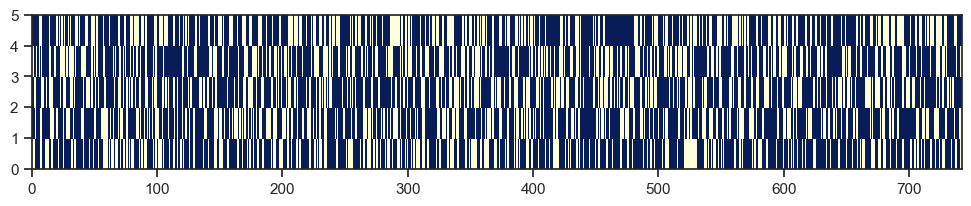

In [24]:
# И визуализируем (синим цветом показаны данные, которые попали в обучающую выборку)
fig, ax = plt.subplots(figsize=(12,2))
ax.pcolor(bin_array, cmap='YlGnBu')
plt.show()

## Бэггинг

In [25]:
# Оценим Out-of-bag error, теоретическое значение 37%
for i in range(5):
    cur_data = bin_array[i]
    len_cur_data = len(cur_data)
    sum_cur_data = sum(cur_data)
    (len(bin_array[0]) - sum(bin_array[0])) / len(bin_array[0])
    oob_i = (len_cur_data - sum_cur_data) / len_cur_data
    print('Для модели № {} размер OOB составляет {}%'.format(i+1, round(oob_i, 4)*100.0))

Для модели № 1 размер OOB составляет 35.709999999999994%
Для модели № 2 размер OOB составляет 36.39%
Для модели № 3 размер OOB составляет 36.93%
Для модели № 4 размер OOB составляет 37.059999999999995%
Для модели № 5 размер OOB составляет 39.489999999999995%


In [26]:
# Out-of-bag error, возвращаемый классификатором
# Для классификации используется метрика accuracy
bc1.oob_score_, 1-bc1.oob_score_

(0.0444743935309973, 0.9555256064690028)

In [65]:
# Визуализация обученных решающих деревьев
names = ['km_driven','ex_showroom_price']
Image(get_png_tree(bc1.estimators_[0], names), width='80%')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.648569 to fit



In [28]:
# Визуализация обученных решающих деревьев
Image(get_png_tree(bc1.estimators_[1], names))

In [29]:
# Визуализация обученных решающих деревьев
Image(get_png_tree(bc1.estimators_[2], names))

In [30]:
# Визуализация обученных решающих деревьев
Image(get_png_tree(bc1.estimators_[3], names))

In [31]:
# Визуализация обученных решающих деревьев
Image(get_png_tree(bc1.estimators_[4], names))

## Визуализация результатов классификации

MemoryError: Unable to allocate 19.5 PiB for an array with shape (62375600, 43982600) and data type float64

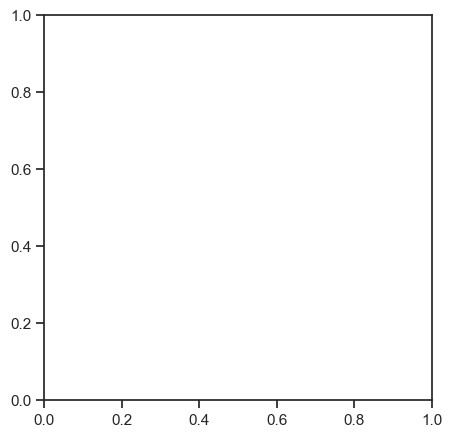

In [56]:
# plot_cl(DecisionTreeClassifier(random_state=1))

In [ ]:

# plot_cl(BaggingClassifier(DecisionTreeClassifier(random_state=1), n_estimators=100))

## Сверхслучайные деревья

In [66]:
# Обучим классификатор на 5 деревьях
tree1 = RandomForestClassifier(n_estimators=5, oob_score=True, random_state=10)
tree1.fit(X_train, y_train)

C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:578: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


RandomForestClassifier(n_estimators=5, oob_score=True, random_state=10)

In [67]:
# Out-of-bag error, возвращаемый классификатором
tree1.oob_score_, 1-tree1.oob_score_

(0.05121293800539083, 0.9487870619946092)

In [68]:
tree1.oob_decision_function_[55:70]

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.05555556, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [69]:
Image(get_png_tree(tree1.estimators_[0], X.columns[3:5]), width="500")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.719 to fit



In [70]:
Image(get_png_tree(tree1.estimators_[4],X.columns[3:5]), width="500")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.787082 to fit



## Бустинг

In [71]:
# Обучим классификатор на 5 деревьях
ab1 = AdaBoostClassifier(n_estimators=5, algorithm='SAMME', random_state=10)
ab1.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', n_estimators=5, random_state=10)

In [ ]:
Image(get_png_tree(ab1.estimators_[0], X.columns[3:5]), width='50%')

In [ ]:
Image(get_png_tree(ab1.estimators_[1], X.columns[3:5]), width='50%')

In [ ]:
Image(get_png_tree(ab1.estimators_[2], X.columns[3:5]), width='50%')

In [ ]:
Image(get_png_tree(ab1.estimators_[3], X.columns[3:5]), width='50%')

In [ ]:
Image(get_png_tree(ab1.estimators_[4], X.columns[3:5]), width='50%')

In [72]:
ab1.estimator_weights_

array([2.19495443, 2.210498  , 2.22386196, 2.3017543 , 2.55140565])

In [74]:
df1 = ab1.decision_function(X_train)
df1.shape

(742, 111)

In [75]:
df1[:10]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

MemoryError: Unable to allocate 19.5 PiB for an array with shape (62375600, 43982600) and data type float64

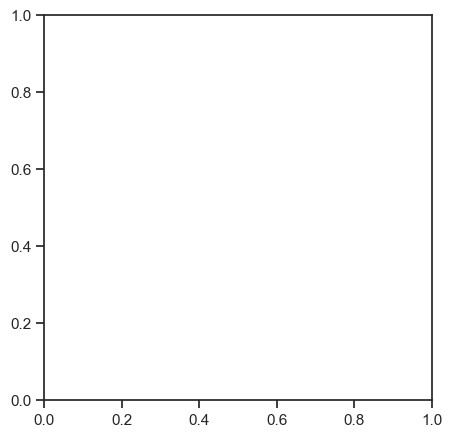

In [76]:
# Результаты классификации
# plot_cl(AdaBoostClassifier(random_state=1))

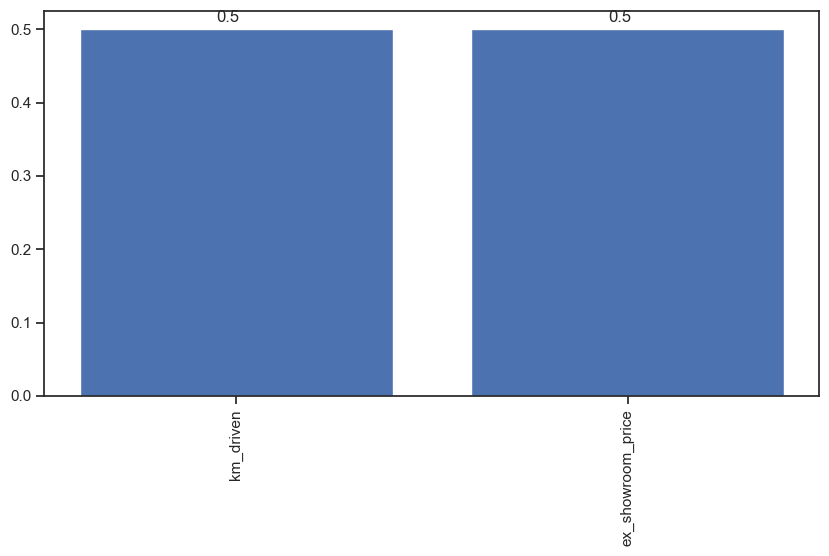

In [78]:
# Важность признаков
names = ['km_driven','ex_showroom_price']
data_x_ds = pd.DataFrame(data=X_train, columns=names)
ab2 = AdaBoostClassifier(random_state=1)
ab2.fit(data_x_ds, y_train)
_,_ = draw_feature_importances(ab2, data_x_ds)

In [81]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC


boost = AdaBoostClassifier(random_state=50, n_estimators=100)
boost.fit(X_train, y_train)

tree = BaggingClassifier(DecisionTreeClassifier(random_state=50), n_estimators=100)
tree.fit(X_train, y_train)

# Стекинг: комбинация логистической регрессии и SVM
estimators = [
    ('lr', LogisticRegression()),
    ('svm', SVC(probability=True))
]
stacking = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(), cv=5)
stacking.fit(X_train, y_train)

# Обучающая выборка
y_train_pred_tree = tree.predict(X_train)
y_train_pred_boost = boost.predict(X_train)
y_train_pred_stacking = stacking.predict(X_train)

# Тестовая выборка
y_test_pred_tree = tree.predict(X_test)
y_test_pred_boost = boost.predict(X_test)
y_test_pred_stacking = stacking.predict(X_test)

# Точность
train_accuracy_tree = accuracy_score(y_train, y_train_pred_tree)
test_accuracy_tree = accuracy_score(y_test, y_test_pred_tree)

train_accuracy_boost = accuracy_score(y_train, y_train_pred_boost)
test_accuracy_boost = accuracy_score(y_test, y_test_pred_boost)

train_accuracy_stacking = accuracy_score(y_train, y_train_pred_stacking)
test_accuracy_stacking = accuracy_score(y_test, y_test_pred_stacking)

print(f"Бэкинг: Train Accuracy = {train_accuracy_tree}, Test Accuracy = {test_accuracy_tree}")
print(f"Бустинг Boosting: Train Accuracy = {train_accuracy_boost}, Test Accuracy = {test_accuracy_boost}")
print(f"Стэкинг: Train Accuracy = {train_accuracy_stacking}, Test Accuracy = {test_accuracy_stacking}")

C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
C:\Users\dasha\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/st

Бэкинг: Train Accuracy = 0.7857142857142857, Test Accuracy = 0.11912225705329153
Бустинг Boosting: Train Accuracy = 0.08086253369272237, Test Accuracy = 0.08463949843260188
Стэкинг: Train Accuracy = 0.10107816711590296, Test Accuracy = 0.0877742946708464
